# SOS, SAIL, SPLASH, and billy precipitation data for 2021-2023 winters.

Author: Daniel Hogan
Created: June 20, 2024

This notebook will start dive into comparisons between SAIL SPLASH and SOS preciptiation observations.

We need to gather the following data:

| Campaign | Location      | Name    | Shield Type                                                                         | Gauge Manufacturer     | Gauge Model                                               |
|----------|---------------|---------|------------------------------------------------------------------------------------|------------------------|-----------------------------------------------------------|
| SAIL     | Gothic        | aosmet  | --                                                                                 | Vaisala                | WXT520/530                                                |
| SAIL     | Gothic        | ld      | --                                                                                 | OTT Hydromet Group     | Parsivel2                                                 |
| SAIL     | Gothic        | met     | --                                                                                 | Optical Scientific     | ORG-815-DS Optical Precipitation Gauge                    |
| SAIL     | Gothic        | met     | Single Alter                                                                       | Novalynx               | 260-2500E-12 Tipping Bucket Rain Gauge                    |
| SAIL     | Gothic        | met     | --                                                                                 | Vaisala                | PWD22                                                     |
| SAIL     | Gothic        | wbpluvio| Double fence? Unknown. Recommended for double fence, but possibly single alter     | OTT Hydromet Group     | Pluvio2-L weighing bucket rain gauge                      |
| SPLASH   | Kettle Ponds  | ld      | --                                                                                 | OTT Hydromet Group     | Parsivel2                                                 |
| SPLASH   | Kettle Ponds  | pluvio  | SDFIR                                                                              | OTT Hydromet Group     | Pluvio2-L weighing bucket rain gauge                      |
| SPLASH   | Kettle Ponds-A| ASFS    | --                                                                                 | Unknown                | Unknown                                                   |
| SPLASH   | Avery Picnic  | ASFS    | --                                                                                 | Unknown                | Unknown                                                   |
| billy    | Gothic        | pluvio  | Single Alter                                                                       | Unknown                | Unknown                                                   |
```

In [1]:
import os
os.chdir('/home/dlhogan/GitHub/S3-precipitation-rodeo/')

In [2]:
# general
import os
import glob
import datetime as dt
import json
# data 
import xarray as xr 
from sublimpy import utils, variables, tidy, turbulence
import numpy as np
import pandas as pd
from act import discovery, plotting
# plotting
import matplotlib.pyplot as plt
from metpy.cbook import get_test_data
from metpy.plots import add_metpy_logo, SkewT
import plotly.express as px 
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.io as pio
import seaborn as sns
# helper tools
from utils.get_sail_data import get_sail_data
from utils.helper_funcs import create_windrose_df, simple_sounding, mean_sounding
import utils.helper_funcs as hf
from metpy import calc, units
import scipy.stats as stats
from sklearn.linear_model import LinearRegression
import time
# make plotly work 
init_notebook_mode(connected=True)
cf.go_offline()

nctoolkit is using Climate Data Operators version 2.4.4


# SOS
### SOS snow pillow data

In [3]:
sos_ds = xr.open_dataset('/home/dlhogan/GitHub/Synoptic-Sublimation/01_data/processed_data/sos/sos_ds_1H_storage.nc').sel(time=slice('2022-12-01', '2023-03-31'))

w23_sos_kp_SWE_p1 = sos_ds['SWE_p1_c']
# remove datapoints where diff is greater than - 30
w23_sos_kp_SWE_p1 = w23_sos_kp_SWE_p1.where(np.abs(w23_sos_kp_SWE_p1.diff('time')) <30, drop=True)
# substract by the first value
w23_sos_kp_SWE_p1 = w23_sos_kp_SWE_p1 - w23_sos_kp_SWE_p1[0]

w23_sos_kp_SWE_p2 = sos_ds['SWE_p2_c']
# remove datapoints where diff is greater than - 30
w23_sos_kp_SWE_p2 = w23_sos_kp_SWE_p2.where(np.abs(w23_sos_kp_SWE_p2.diff('time')) <30, drop=True)
# substract by the first value
w23_sos_kp_SWE_p2 = w23_sos_kp_SWE_p2 - w23_sos_kp_SWE_p2[0]

w23_sos_kp_SWE_p3 = sos_ds['SWE_p3_c']
# remove datapoints where diff is greater than - 30
w23_sos_kp_SWE_p3 = w23_sos_kp_SWE_p3.where(np.abs(w23_sos_kp_SWE_p3.diff('time')) <30, drop=True)
# substract by the first value
w23_sos_kp_SWE_p3 = w23_sos_kp_SWE_p3 - w23_sos_kp_SWE_p3[0]

w23_sos_kp_SWE_p4 = sos_ds['SWE_p4_c']
# remove datapoints where diff is greater than - 30
w23_sos_kp_SWE_p4 = w23_sos_kp_SWE_p4.where(np.abs(w23_sos_kp_SWE_p4.diff('time')) <30, drop=True)
# substract by the first value
w23_sos_kp_SWE_p4 = w23_sos_kp_SWE_p4 - w23_sos_kp_SWE_p4[0]

# for ds in [w23_sos_kp_SWE_p1, w23_sos_kp_SWE_p2, w23_sos_kp_SWE_p3, w23_sos_kp_SWE_p4]:
#     ds.plot()


In [4]:
w23_sos_kp_SWE = xr.merge([w23_sos_kp_SWE_p1, w23_sos_kp_SWE_p2, w23_sos_kp_SWE_p3, w23_sos_kp_SWE_p4])
w23_sos_kp_SWE.to_netcdf('/home/dlhogan/GitHub/Synoptic-Sublimation/01_data/processed_data/sos/w23_sos_kp_SWE.nc')

# SAIL

### Setup to download SAIL data

In [5]:
# Function to load ARM credentials
def load_arm_credentials(credential_path):
    with open(credential_path, 'r') as f:
        credentials = json.load(f)
    return credentials
# Location of ARM credentials
credential_path = '/home/dlhogan/.act_config.json'
credentials = load_arm_credentials(credential_path)
# api token and username for ARM
api_username = credentials.get('username')
api_token = credentials.get('token')

sail_datastream_dict = {
    # "aosmet":"gucaosmetM1.a1", # Too short for analysis
    "met":"gucmetM1.b1",
    "laser_disdrometer_gothic":"gucldM1.b1",
    "ldquants":"gucldquantsM1.c1",
    "pluvio2":"gucwbpluvio2M1.a1",
}

In [6]:
winter_22 = ('20211001','20220930')
winter_23 = ('20221001','20230930')

In [7]:
# Set the location of the data folder where this data will be stored
winter_22_folder = 'winter_21_22'
winter_23_folder = 'winter_22_23'
 # change to location of data folder on your machine
storage_directory = f'/storage/dlhogan/synoptic_sublimation/'
# create a sail_data folder if it does not exist
if not os.path.exists(os.path.join(storage_directory,'sail_data')):
    os.makedirs(os.path.join(storage_directory,'sail_data'))
# create a folder for the event if it does not exist
if not os.path.exists(os.path.join(storage_directory,'sail_data',winter_22_folder)):
    os.makedirs(os.path.join(storage_directory,'sail_data',winter_22_folder))
if not os.path.exists(os.path.join(storage_directory,'sail_data',winter_22_folder,'radiosonde')):
    os.makedirs(os.path.join(storage_directory,'sail_data',winter_22_folder,'radiosonde'))
# create a folder for the event if it does not exist
if not os.path.exists(os.path.join(storage_directory,'sail_data',winter_23_folder)):
    os.makedirs(os.path.join(storage_directory,'sail_data',winter_23_folder))
    # make a radiosonde folder if it does not exist
if not os.path.exists(os.path.join(storage_directory,'sail_data',winter_23_folder,'radiosonde')):
    os.makedirs(os.path.join(storage_directory,'sail_data',winter_23_folder,'radiosonde'))

### Download winter 2022 data from SAIL
For now we will just get met, ecor, and laser disdrometer data

In [8]:
# load in the winter 22 data
sail_winter_22_folder = os.path.join(storage_directory,'sail_data',winter_22_folder)
# create empty data dictionary
w22_data_loc_dict = {}
# Iterate through the dictionary and pull the data for each datastream
for k,v in sail_datastream_dict.items():
    if (k =='radiosonde') & (len(os.listdir(os.path.join(sail_winter_22_folder,"radiosonde"))) > 0):
        print("Radiosonde data already donwloaded.")
        print('-------------------')
    # Check if the file already exists
    elif (os.path.exists(f'{sail_winter_22_folder}/{k}_{winter_22[0]}_{winter_22[1]}.nc')): 
        print(f'{k}_{winter_22[0]}_{winter_22[1]}.nc already exists')
        print('-------------------')
        # add the filename to the dictionary which can be used if we want to load the data
        w22_data_loc_dict[k] = os.path.join(sail_winter_22_folder,f'{k}_{winter_22[0]}_{winter_22[1]}.nc')
        continue
    else:
        # explicitly download radiosonde data because they are a lot easier to process and think about when in individual files
        if k == 'radiosonde':
            discovery.download_data(
                api_username,
                api_token,
                v,
                startdate=winter_22[0],
                enddate=winter_22[1],
                output=sail_winter_22_folder+'/radiosonde/'
            )
        else:
            ds = get_sail_data(api_username,
                        api_token,
                        v,
                        startdate=winter_22[0],
                        enddate=winter_22[1])
            ds.to_netcdf(f'{sail_winter_22_folder}/{k}_{winter_22[0]}_{winter_22[1]}.nc')
            w22_data_loc_dict[k] = os.path.join(sail_winter_22_folder,f'{k}_{winter_22[0]}_{winter_22[1]}.nc')

met_20211001_20220930.nc already exists
-------------------
laser_disdrometer_gothic_20211001_20220930.nc already exists
-------------------
ldquants_20211001_20220930.nc already exists
-------------------
pluvio2_20211001_20220930.nc already exists
-------------------


In [9]:
w22_SAIL_gts_met = xr.open_dataset(w22_data_loc_dict['met']).sel(time=slice('2021-11-30','2022-05-12'))
w22_SAIL_gts_ld = xr.open_dataset(w22_data_loc_dict['laser_disdrometer_gothic']).sel(time=slice('2021-11-30','2022-05-12'))
w22_SAIL_gts_ldq = xr.open_dataset(w22_data_loc_dict['ldquants']).sel(time=slice('2021-11-30','2022-05-12'))
w22_SAIL_gts_pluvio = xr.open_dataset(w22_data_loc_dict['pluvio2']).sel(time=slice('2021-11-30','2022-05-12'))


In [10]:
# print the temporal resolution of each dataset
for ds in [w22_SAIL_gts_met,w22_SAIL_gts_ld,w22_SAIL_gts_ldq,w22_SAIL_gts_pluvio]:
    # calculate the average difference between time steps
    time_diff = np.mean(np.diff(ds.time.values))
    # convert to minutes
    time_diff = time_diff/np.timedelta64(1,'m')
    print(f'{ds.datastream} has a temporal resolution of {int(time_diff)} minutes')
    print('-------------------')

gucmetM1.b1 has a temporal resolution of 1 minutes
-------------------
gucldM1.b1 has a temporal resolution of 1 minutes
-------------------
gucldquantsM1.c1 has a temporal resolution of 1 minutes
-------------------
gucwbpluvio2M1.a1 has a temporal resolution of 1 minutes
-------------------


In [11]:
# create a function to resample using to 1 hour sums while saving the attributes and resampling in pandas
def resample_ds_using_pandas(ds,rule='1H', instrument='met'):
    # drop all dimensions except time
    ds = ds.drop_dims([k for k in ds.dims if k != 'time'])
    # drop all variables that are not int or float
    for k,v in ds.data_vars.items():
        if v.dtype not in ['int32','float32','int64','float64']:
            ds = ds.drop_vars(k)
    # save the overall attributes and the attributes for each variables
    variable_attrs = {k:v.attrs for k,v in ds.data_vars.items()}
    # convert the dataset to a pandas dataframe
    df = ds.to_dataframe()
    # resample the dataframe, for pwd_cumul_rain, pwd_cumul_snow, org_precip_rate_mean, tbrg_precip_total, take the sum , for the rest take the mean
    if instrument == 'met':
        df_resampled = df.resample(rule).agg({k:'sum' for k in ['pwd_cumul_rain','pwd_cumul_snow','org_precip_rate_mean','tbrg_precip_total']} | 
                                            {k:'mean' for k in df.columns if k not in ['pwd_cumul_rain','pwd_cumul_snow','org_precip_rate_mean','tbrg_precip_total']})
    else:
        df_resampled = df.resample(rule).sum()
    # convert the dataframe back to a dataset
    ds_resampled = df_resampled.to_xarray()
    # add the attributes back to the dataset
    ds_resampled.attrs = ds.attrs
    for k,v in variable_attrs.items():
        ds_resampled[k].attrs = v
    return ds_resampled

In [12]:
# resample the datasets to 1H
w22_SAIL_gts_met_1H = resample_ds_using_pandas(w22_SAIL_gts_met)
w22_SAIL_gts_ld_1H = resample_ds_using_pandas(w22_SAIL_gts_ld, instrument='ld')
w22_SAIL_gts_ldq_1H = resample_ds_using_pandas(w22_SAIL_gts_ldq, instrument='ld')
w22_SAIL_gts_pluvio_1H = resample_ds_using_pandas(w22_SAIL_gts_pluvio, instrument='pluvio')

### Download winter 2023 data from SAIL
For now we will just get met, ecor, and laser disdrometer data

In [13]:
# load in the winter 23 data
sail_winter_23_folder = os.path.join(storage_directory,'sail_data',winter_23_folder)
# create empty data dictionary
w23_data_loc_dict = {}
# Iterate through the dictionary and pull the data for each datastream
for k,v in sail_datastream_dict.items():
    if (k =='radiosonde') & (len(os.listdir(os.path.join(sail_winter_23_folder,"radiosonde"))) > 0):
        print("Radiosonde data already donwloaded.")
        print('-------------------')
    # Check if the file already exists
    elif (os.path.exists(f'{sail_winter_23_folder}/{k}_{winter_23[0]}_{winter_23[1]}.nc')): 
        print(f'{k}_{winter_23[0]}_{winter_23[1]}.nc already exists')
        print('-------------------')
        # add the filename to the dictionary which can be used if we want to load the data
        w23_data_loc_dict[k] = os.path.join(sail_winter_23_folder,f'{k}_{winter_23[0]}_{winter_23[1]}.nc')
        continue
    else:
        # explicitly download radiosonde data because they are a lot easier to process and think about when in individual files
        if k == 'radiosonde':
            discovery.download_data(
                api_username,
                api_token,
                v,
                startdate=winter_23[0],
                enddate=winter_23[1],
                output=sail_winter_23_folder+'/radiosonde/'
            )
        else:
            ds = get_sail_data(api_username,
                        api_token,
                        v,
                        startdate=winter_23[0],
                        enddate=winter_23[1])
            ds.to_netcdf(f'{sail_winter_23_folder}/{k}_{winter_23[0]}_{winter_23[1]}.nc')
            w23_data_loc_dict[k] = os.path.join(sail_winter_23_folder,f'{k}_{winter_23[0]}_{winter_23[1]}.nc')

met_20221001_20230930.nc already exists
-------------------
laser_disdrometer_gothic_20221001_20230930.nc already exists
-------------------
ldquants_20221001_20230930.nc already exists
-------------------
pluvio2_20221001_20230930.nc already exists
-------------------


In [14]:
w23_SAIL_gts_met = xr.open_dataset(w23_data_loc_dict['met']).sel(time=slice('2022-11-30','2023-06-18'))
w23_SAIL_gts_ld = xr.open_dataset(w23_data_loc_dict['laser_disdrometer_gothic']).sel(time=slice('2022-11-30','2023-06-18'))
w23_SAIL_gts_ldq = xr.open_dataset(w23_data_loc_dict['ldquants']).sel(time=slice('2022-11-30','2023-06-18'))
w23_SAIL_gts_pluvio = xr.open_dataset(w23_data_loc_dict['pluvio2']).sel(time=slice('2022-11-30','2023-06-18'))

In [15]:
# resample the datasets to 1H
w23_SAIL_gts_met_1H = resample_ds_using_pandas(w23_SAIL_gts_met)
w23_SAIL_gts_ld_1H = resample_ds_using_pandas(w23_SAIL_gts_ld, instrument='ld')
w23_SAIL_gts_ldq_1H = resample_ds_using_pandas(w23_SAIL_gts_ldq, instrument='ld')
w23_SAIL_gts_pluvio_1H = resample_ds_using_pandas(w23_SAIL_gts_pluvio, instrument='pluvio')

### Pull in corrected disdrometer data

In [16]:
w22_SAIL_gts_ld_corrected = xr.open_dataset('/home/dlhogan/GitHub/Synoptic-Sublimation/01_data/processed_data/sail/precipitation_rate_gts_w22.nc')
w23_SAIL_gts_ld_corrected = xr.open_dataset('/home/dlhogan/GitHub/Synoptic-Sublimation/01_data/processed_data/sail/precipitation_rate_gts_w23.nc')

# SPLASH

### Get Tilden's data from the small double fenced intercomparison reference gauge

In [17]:
# open tilden's precipitaiton data
w23_SPLASH_kp_tilden_prcp = pd.read_csv('/home/dlhogan/GitHub/Synoptic-Sublimation/01_data/processed_data/splash/tilden_precip_2022_2023.csv', index_col=0, parse_dates=True)

### Get ASFS data 

Nevermind... no precip data here...

### Get Ceilometer Data for Kettle Ponds
- gathered from the [Zenodo site](https://zenodo.org/records/10520198/files/ckp.cl51.cloud_prod.zip?download=1)
- data corrected in `08_wind_and_precipitation.ipynb`

In [18]:
w22_SPLASH_kp_ld_corrected = xr.open_dataset('/home/dlhogan/GitHub/Synoptic-Sublimation/01_data/processed_data/splash/corrected_ldis_precipitation_rate_kps_w22.nc')
w23_SPLASH_kp_ld_corrected = xr.open_dataset('/home/dlhogan/GitHub/Synoptic-Sublimation/01_data/processed_data/splash/corrected_ldis_precipitation_rate_kps_w23.nc')
# all values must be greater or equal to 0
w22_SPLASh_kp_ld_corrected = w22_SPLASH_kp_ld_corrected.where(w22_SPLASH_kp_ld_corrected >= 0, 0)
w23_SPLASH_kp_ld_corrected = w23_SPLASH_kp_ld_corrected.where(w23_SPLASH_kp_ld_corrected >= 0, 0)

# billy barr

In [19]:
# billy barr precipitation data
bb_gts_prcp = pd.read_csv('/home/dlhogan/GitHub/Synoptic-Sublimation/01_data/raw_data/billy_barr/billy_barr_data.xls',skiprows=[1], header=0, delimiter='\t')
# use columns 1 and 2 as the datetime combining date and time
bb_gts_prcp['datetime'] = pd.to_datetime(bb_gts_prcp['Date'] + ' ' + bb_gts_prcp['Time of Day'])
# set the datetime as the index
bb_gts_prcp['datetime'] = pd.to_datetime(bb_gts_prcp['datetime'])

bb_gts_prcp = bb_gts_prcp.set_index('datetime')
# drop the Date and Time of Day columns
bb_gts_prcp = bb_gts_prcp.drop(columns=['Date','Time of Day'])

# winter 22 and 23 data
w22_bb_prcp = bb_gts_prcp.loc['2021-11-30':'2022-05-12']
w23_bb_prcp = bb_gts_prcp.loc['2022-11-30':'2023-06-18']


# SQUIRE Snowfall

In [20]:
w22_squire_prcp = pd.read_csv('./01_data_preparation/precipitation/w22_squire_snow_rates.csv', index_col=0, parse_dates=True)
w23_squire_prcp = pd.read_csv('./01_data_preparation/precipitation/w23_squire_snow_rates.csv', index_col=0, parse_dates=True)

### Build a single dataframe for all the data

# Plotting them up

In [ ]:
fig = go.Figure()
# locations
fig.add_trace(go.Scatter(x=[w22_bb_prcp.index[0]], y=[w22_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines', name='Gothic', line=dict(color='gray', dash='solid'), legendgroup='loc', legendgrouptitle_text="Location"),)
fig.add_trace(go.Scatter(x=[w22_bb_prcp.index[0]], y=[w22_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines', name='billy barr', line=dict(color='gray', dash='dot'), legendgroup='loc'),)
fig.add_trace(go.Scatter(x=[w22_bb_prcp.index[0]], y=[w22_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines', name='Kettle Ponds', line=dict(color='gray', dash='dash'), legendgroup='loc'),)
# instrument types
fig.add_trace(go.Scatter(x=[w22_bb_prcp.index[0]], y=[w22_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines', name='weighing bucket', line=dict(color='green'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
fig.add_trace(go.Scatter(x=[w22_bb_prcp.index[0]], y=[w22_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines', name='tipping bucket', line=dict(color='purple'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
fig.add_trace(go.Scatter(x=[w22_bb_prcp.index[0]], y=[w22_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines', name='laser disdrometer', line=dict(color='red'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
fig.add_trace(go.Scatter(x=[w22_bb_prcp.index[0]], y=[w22_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines', name='optical rain gauge', line=dict(color='orange'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
fig.add_trace(go.Scatter(x=[w22_bb_prcp.index[0]], y=[w22_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines', name='present weather detector', line=dict(color='black'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
# fig.add_trace(go.Scatter(x=[w22_bb_prcp.index[0]], y=[w22_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines', name='corrected laser disdrometer', line=dict(color='magenta'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
fig.add_trace(go.Scatter(x=[w22_bb_prcp.index[0]], y=[w22_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines', name='radar', line=dict(color='maroon'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"))

# billy's house
fig.add_trace(go.Scatter(x=w22_bb_prcp.index, 
                         y=w22_bb_prcp['Precipitation'].cumsum(), 
                         name='billy barr "missile"', 
                         mode='lines',
                         showlegend=False, 
                         line=dict(color='green', dash='dot')))
# Gothic Locations
fig.add_trace(go.Scatter(x=w22_SAIL_gts_pluvio_1H.time,
                            y=w22_SAIL_gts_pluvio_1H['accum_rtnrt'].cumsum(),
                            name='SAIL GTS WB', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='green')))
fig.add_trace(go.Scatter(x=w22_SAIL_gts_met_1H.time,
                            y=w22_SAIL_gts_met_1H['tbrg_precip_total'].cumsum(),
                            name='SAIL GTS TB', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='purple'))) 
fig.add_trace(go.Scatter(x=w22_SAIL_gts_met_1H.time,
                            y=(w22_SAIL_gts_met_1H['org_precip_rate_mean']/60).cumsum(),
                            name='SAIL GTS ORG', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='orange')))
fig.add_trace(go.Scatter(x=w22_SAIL_gts_met_1H.where(w22_SAIL_gts_met_1H.qc_pwd_precip_rate_mean_1min==0).time,
                            y=(w22_SAIL_gts_met_1H.where(w22_SAIL_gts_met_1H.qc_pwd_precip_rate_mean_1min==0)['pwd_precip_rate_mean_1min']).cumsum(),
                            name='SAIL GTS PWD', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='black')))
fig.add_trace(go.Scatter(x=w22_SAIL_gts_ld_1H.time,
                            y=(w22_SAIL_gts_ld_1H['precip_rate']/60).cumsum(),
                            name='SAIL GTS LD (raw)', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='red')))
# fig.add_trace(go.Scatter(x=w22_SAIL_gts_ld_corrected.time,
#                          y=(w22_SAIL_gts_ld_corrected['corrected_prcp_rate_m2']).cumsum(),
#                          mode='lines',
#                          showlegend=False,
#                          name='SAIL GTS LD (corrected)',
#                          line=dict(color='magenta',)))
fig.add_trace(go.Scatter(x=w22_squire_prcp.index,
                            y=(w22_squire_prcp['snow_rate_ws88diw']).cumsum().bfill(),
                            name='SAIL X-band Radar', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='maroon')))
# Kettle Ponds
fig.add_trace(go.Scatter(x=w22_SPLASH_kp_ld_corrected.time,
                            y=(w22_SPLASH_kp_ld_corrected['Amount']/30).cumsum(), # divid 30 because raw data was 2-minute resolution
                            name='SPLASH KPS LD (raw)', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='red', dash='dash')))
# fig.add_trace(go.Scatter(x=w22_SPLASH_kp_ld_corrected.time,
#                             y=w22_SPLASH_kp_ld_corrected['corrected_prcp_rate_m2'].cumsum(),
#                             name='SPLASH KPS LD (corrected)', 
#                             mode='lines',
#                             showlegend=False, 
#                             line=dict(color='magenta', dash='dash'))) 

fig.update_layout(
                    # title='Winter 22 Precipitation Comparison',
                    xaxis_title='Date',
                    yaxis_title='Cumulative Precipitation (mm)',
                    xaxis_range=['2021-12-01','2022-03-31'],
                    yaxis_range=[0,800],
                    showlegend=True,
                    hovermode='x unified',
                    width=800,
                    height=600,
                    font=dict(
                                size=18,
                                )
    )
# update hover template with constant x-axis
fig.update_traces(hovertemplate='Prcp: %{y}mm',)
                        

### Cumulative sum plots 

In [22]:
# List of datasets
datasets = [
    w22_bb_prcp['Precipitation'],
    (w22_SAIL_gts_pluvio_1H['accum_rtnrt']).to_dataframe(name='SAIL_gts_pluvio'),
    (w22_SAIL_gts_met['tbrg_precip_total']).to_dataframe(name='SAIL_gts_met_tbrg'),
    (w22_SAIL_gts_met_1H['org_precip_rate_mean'] / 60).to_dataframe(name='SAIL_gts_met_org'),
    (w22_SAIL_gts_met_1H.where(w22_SAIL_gts_met_1H.qc_pwd_precip_rate_mean_1min == 0)['pwd_precip_rate_mean_1min']).to_dataframe(name='SAIL_gts_met_pwd'),
    (w22_SAIL_gts_ld_1H['precip_rate'] / 60).to_dataframe(name='SAIL_gts_ld'),
    # (w22_SAIL_gts_ld_corrected['corrected_prcp_rate_m2']).to_dataframe(name='SAIL_gts_ld_corrected'),
    # (w22_SAIL_gts_ldq_1H['rain_rate'] / 60).to_dataframe(name='SAIL_gts_ldq'),
    (w22_SPLASH_kp_ld_corrected['Amount']/30).to_dataframe(name='SPLASH_kp_ld'),
    (w22_squire_prcp['snow_rate_ws88diw']),
    # (w22_SPLASH_kp_ld_corrected['corrected_prcp_rate_m2']).to_dataframe(name='SPLASH_kp_ld_corrected'),
]
# if dataset is xarray, convert to pandas dataframe
datasets = [data.to_dataframe() if isinstance(data, xr.Dataset) else data for data in datasets]

# Resample each dataset to hourly resolution and compute cumulative sum
resampled_datasets_1H = pd.concat([data.resample('H').sum() for data in datasets], axis=1)
resampled_datasets_1H_cumsum = [data.resample('H').sum().cumsum() for data in datasets]
resampled_datasets_30min = [data.resample('30min').sum() for data in datasets]


w22_all_precip_1H_df = pd.concat(resampled_datasets_1H_cumsum, axis=1)#.drop(columns=['range'])
w22_all_precip_30min_df = pd.concat(resampled_datasets_30min, axis=1)#.drop(columns=['range'])

# rename columns
w22_all_precip_30min_df = w22_all_precip_30min_df.rename(columns={'Precipitation':'billy_barr_missile','Precip_mm':'SPLASH_kps_sdfir'})
# save the 30 minute resolution data
# w22_all_precip_30min_df.to_csv('./01_data_preparation/processed_data/precipitation/w22_all_precip_30min.csv')


In [23]:
# calculate the mean bias with respect to the first column
bias = resampled_datasets_1H.subtract(resampled_datasets_1H.iloc[:,0], axis=0)
# calculate the mean absolute bias
mean_bias = bias.mean()
mean_bias

Precipitation        0.000000
SAIL_gts_pluvio     -0.001549
SAIL_gts_met_tbrg   -0.035687
SAIL_gts_met_org     0.151285
SAIL_gts_met_pwd     0.044848
SAIL_gts_ld          0.129346
SPLASH_kp_ld         0.066032
snow_rate_ws88diw    0.010730
dtype: float64

In [25]:
# corrected_cols = [col for col in w22_all_precip_1H_df.columns if 'corrected' in col]
# # Resample each dataset to hourly resolution and compute cumulative sum
# resampled_datasets = [data.resample('1H').sum() for data in datasets]
# w22_all_precip_1H_df_corr = pd.concat(resampled_datasets, axis=1).drop(columns=['range']+corrected_cols)
# # describe rmse between each column
# w22_all_precip_1H_df_corr = w22_all_precip_1H_df_corr.rename(columns={'Precipitation':'billy_barr_missile','Precip_mm':'SPLASH_kps_sdfir'})
# mask = np.triu(np.ones_like(w22_all_precip_1H_df_corr.corr(), dtype=bool))
# import seaborn as sns
# sns.heatmap(w22_all_precip_1H_df_corr.corr(), cmap='viridis', annot=True, fmt=".1f", mask=mask, vmin=0, vmax=1, cbar_kws={'label':'Correlation'})
# # colorbar label

In [26]:
# # Resample each dataset to hourly resolution and compute cumulative sum
# plt.style.use('seaborn-v0_8-talk')
# resampled_datasets = [data.resample('1D').sum() for data in datasets]
# corrected_cols = [col for col in w22_all_precip_1H_df.columns if 'corrected' in col]
# w22_all_precip_1H_df_rmse = pd.concat(resampled_datasets, axis=1).drop(columns=['range']+corrected_cols)
# w22_all_precip_1H_df_rmse = w22_all_precip_1H_df_rmse.rename(columns={'Precipitation':'billy_barr_missile','Precip_mm':'SPLASH_kps_sdfir'})
# # describe rmse between each column
# rmse = {}
# def mean_squared_error(y_true, y_pred):
#     return np.mean((y_true - y_pred)**2)
# for col1 in w22_all_precip_1H_df_rmse.columns:
#     for col2 in w22_all_precip_1H_df_rmse.columns:
#         rmse[(col1,col2)] = np.sqrt(mean_squared_error(w22_all_precip_1H_df_rmse[col1],w22_all_precip_1H_df_rmse[col2]))
# # make a dataframe of the rmse
# rmse_df = pd.DataFrame(rmse.values(), index=pd.MultiIndex.from_tuples(rmse.keys()), columns=[''])
# # rmse_df = rmse_df[w22_all_precip_1H_df_corr.columns]
# # make a matrix plot of the rmse_df
# mask = np.triu(np.ones_like(rmse_df.unstack(), dtype=bool))
# import seaborn as sns
# sns.heatmap(rmse_df.unstack()[::-1][rmse_df.unstack().columns[::-1]], cmap='Reds', annot=True, fmt=".1f", mask=mask, vmin=0, vmax=20, cbar_kws={'label':'RMSE (mm)'})
# # colorbar label


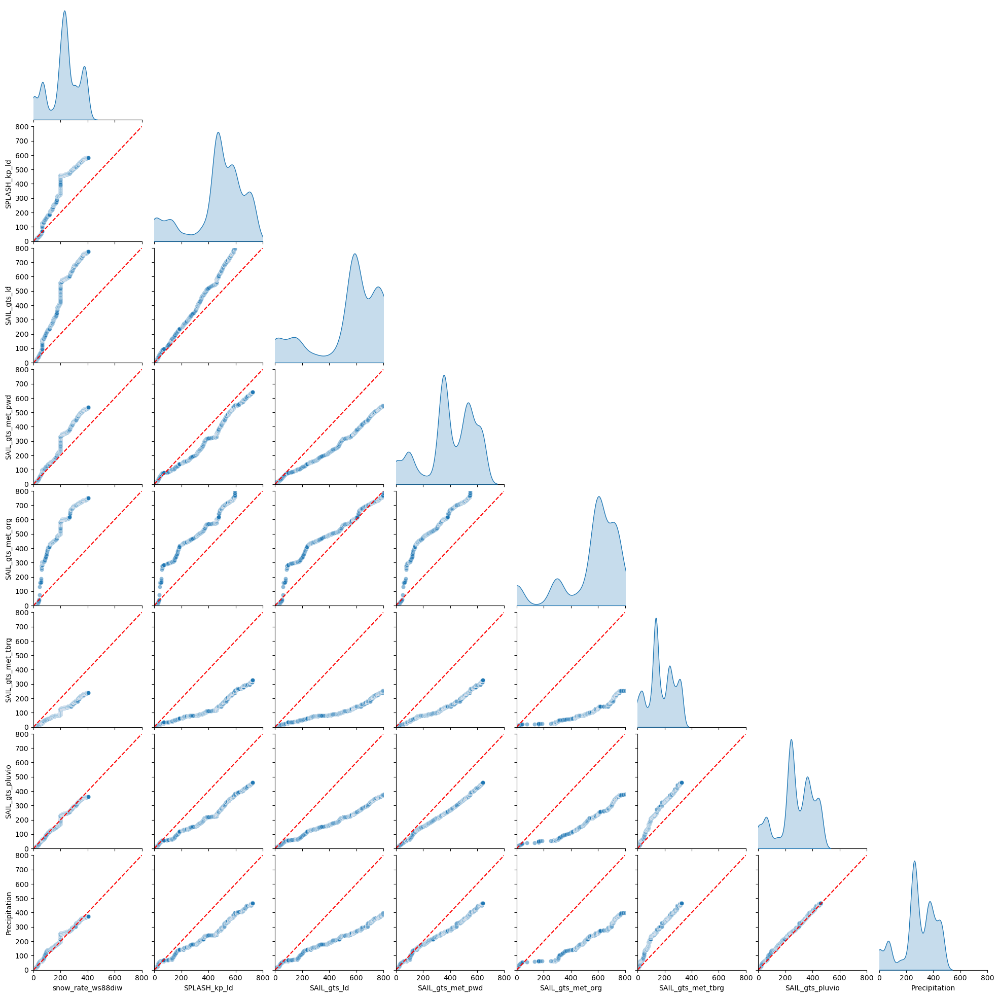

In [ ]:
# plot each column against the other in w22_all_precip_1H_df
g=sns.pairplot(data=w22_all_precip_1H_df[[col for col in w22_all_precip_1H_df.columns[::-1] if 'corrected' not in col]], diag_kind='kde', plot_kws={'alpha':0.5},corner=True)
# set the x and y axis limits to 0 to 800
g.set(xlim=(0,800), ylim=(0,800))
# Function to add 1:1 line
def add_1to1_line(*args, **kwargs):
    plt.plot([0, 1], [0, 1], transform=plt.gca().transAxes, ls='--', c='red')

# Map the function to the lower and upper triangles
g.map_lower(add_1to1_line)
g.map_upper(add_1to1_line)
# only show the lower triangle
g.map_upper(plt.scatter, alpha=0)

<xarray.Dataset>
Dimensions:                       (time: 4768)
Coordinates:
  * time                          (time) datetime64[ns] 2022-11-30 ... 2023-0...
Data variables: (12/48)
    pwd_cumul_rain                (time) float32 2.613e+03 ... 1.111e+03
    pwd_cumul_snow                (time) float32 2.61e+04 2.61e+04 ... 4.5e+04
    org_precip_rate_mean          (time) float32 0.554 0.0 0.0 ... 0.0 0.023
    tbrg_precip_total             (time) float32 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    atmos_pressure                (time) float32 70.93 71.03 ... 71.95 71.94
    qc_atmos_pressure             (time) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    ...                            ...
    qc_logger_volt                (time) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    logger_temp                   (time) float32 -3.462 -5.246 ... 12.61 16.07
    qc_logger_temp                (time) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    lat                           (time) float32 38.96 38.96 ... 38.96 38.96
    lon                           (time) float32 -107.0 -107.0 ... -107.0 -107.0
    alt                           (time) float32 2.886e+03 ... 2.886e+03
Attributes: (12/21)
    command_line:                met_ingest -s guc -f M1 -RD --max-runtime 0
    Conventions:                 ARM-1.3
    process_version:             ingest-met-4.53-0.el7
    dod_version:                 met-b1-11.2
    input_source:                /data/reproc/D230616.3/collection/guc/gucmet...
    site_id:                     guc
    ...                          ...
    averaging_interval_comment:  The time assigned to each data point indicat...
    org:                         Optical Rain Gauge
    tbrg:                        Tipping Bucket Rain Gauge
    pwd:                         Present Weather Detector
    tbrg_precip_corr_info:       0.000000 * tbrg_precip_total^2 + 0.000000 * ...
    history:                     created by user erwinmj on machine prod-proc...

In [77]:
fig = go.Figure()
# locations
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='Gothic', line=dict(color='gray', dash='solid'), legendgroup='loc', legendgrouptitle_text="Location"),)
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='billy barr', line=dict(color='gray', dash='dot'), legendgroup='loc'),)
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='Kettle Ponds', line=dict(color='gray', dash='dash'), legendgroup='loc'),)
# instrument types
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='weighing bucket', line=dict(color='green'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='tipping bucket', line=dict(color='purple'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='optical rain gauge', line=dict(color='orange'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='present weather detector', line=dict(color='black'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='laser disdrometer', line=dict(color='red'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='radar', line=dict(color='maroon'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"))
# fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',
# name='corrected laser disdrometer', line=dict(color='magenta'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
# fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',
# name='laser disdrometer quants VAP', line=dict(color='pink'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"))
# fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='SOS snow pillow', line=dict(color='blue'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"))

fig.add_trace(go.Scatter(x=w23_bb_prcp[w23_bb_prcp['Precipitation']<10].index, 
                         y=(w23_bb_prcp[w23_bb_prcp['Precipitation']<10]['Precipitation']-mean_bias['Precipitation']).cumsum(), 
                         name='billy barr', 
                         mode='lines',
                         showlegend=False, 
                         line=dict(color='green', dash='dot')))
# Gothic
fig.add_trace(go.Scatter(x=w23_SAIL_gts_pluvio_1H.time,
                            y=(w23_SAIL_gts_pluvio_1H['accum_rtnrt']-mean_bias['SAIL_gts_pluvio']).cumsum(),
                            name='SAIL GTS WB', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='green')))
fig.add_trace(go.Scatter(x=w23_SAIL_gts_met_1H.time,
                            y=(w23_SAIL_gts_met_1H['tbrg_precip_total']-mean_bias['SAIL_gts_met_tbrg']).cumsum(),
                            name='SAIL GTS TB', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='purple'))) 
fig.add_trace(go.Scatter(x=w23_SAIL_gts_met_1H.time,
                            y=((w23_SAIL_gts_met_1H['org_precip_rate_mean']/60)-mean_bias['SAIL_gts_met_org']/60).cumsum(),
                            name='SAIL GTS ORG', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='orange')))
fig.add_trace(go.Scatter(x=w23_SAIL_gts_met_1H.where(w23_SAIL_gts_met_1H.qc_pwd_precip_rate_mean_1min==0).time,
                            y=((w23_SAIL_gts_met_1H.where(w23_SAIL_gts_met_1H.qc_pwd_precip_rate_mean_1min==0)['pwd_precip_rate_mean_1min'])-mean_bias['SAIL_gts_met_pwd']).cumsum(),
                            name='SAIL GTS PWD', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='black')))
fig.add_trace(go.Scatter(x=w23_SAIL_gts_ld_1H.time,
                            y=((w23_SAIL_gts_ld_1H['precip_rate']/60)-mean_bias['SAIL_gts_ld']).cumsum(),
                            name='SAIL GTS LD (raw)', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='red')))
# fig.add_trace(go.Scatter(x=w23_SAIL_gts_ld_corrected.time,
#                          y=(w23_SAIL_gts_ld_corrected['corrected_prcp_rate_m2']).cumsum(),
#                          mode='lines',
#                          showlegend=False,
#                          name='SAIL GTS LD (corrected)',
#                          line=dict(color='magenta')))
# fig.add_trace(go.Scatter(x=w23_SAIL_gts_ldq_1H.time,
#                             y=(w23_SAIL_gts_ldq_1H['rain_rate']/60).cumsum(),
#                             name='SAIL GTS LDQ', 
#                             mode='lines',
#                             showlegend=False, 
#                             line=dict(color='pink')))
fig.add_trace(go.Scatter(x=w23_squire_prcp.index,
                            y=(w23_squire_prcp['snow_rate_ws88diw'].bfill() - mean_bias['snow_rate_ws88diw']).cumsum(),
                            name='SAIL X-band Radar', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='maroon')))    
# Kettle Ponds
fig.add_trace(go.Scatter(x=w23_SPLASH_kp_ld_corrected.time,
                            y=((w23_SPLASH_kp_ld_corrected['Amount']/30)-mean_bias['SPLASH_kp_ld']).cumsum(),
                            name='SPLASH KPS LD (raw)', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='red', dash='dash')))
# fig.add_trace(go.Scatter(x=w23_SPLASH_kp_ld_corrected.time,
#                             y=w23_SPLASH_kp_ld_corrected['corrected_prcp_rate_m2'].cumsum(),
#                             name='SPLASH KPS LD (corrected)', 
#                             mode='lines',
#                             showlegend=False, 
#                             line=dict(color='magenta', dash='dash')))                     
# fig.add_trace(go.Scatter(x=w23_SPLASH_kp_tilden_prcp.loc[dt.date(2022,12,1):dt.date(2023,4,1)].index,
#                          y=w23_SPLASH_kp_tilden_prcp['Precip_mm'].loc[dt.date(2022,12,1):dt.date(2023,4,1)].cumsum(),
#                          name='SPLASH Kettle Ponds SDFIR WB',
#                          mode='lines',
#                          showlegend=False,
#                          line=dict(color='green', dash='dash')))
# for i, ds in enumerate([w23_sos_kp_SWE_p1, w23_sos_kp_SWE_p2, w23_sos_kp_SWE_p3, w23_sos_kp_SWE_p4]):
#     fig.add_trace(go.Scatter(x=ds.time,
#                             y=ds,
#                             name=f'SOS Kettle Ponds Snow Pillow {i}',
#                             mode='lines',
#                             showlegend=False,
#                             line=dict(color='blue', dash='dash')))
                         
fig.update_layout(
                    # title='Winter 23 Precipitation Comparison',
                    xaxis_title='Date',
                    yaxis_title='Cumulative Precipitation (mm)',
                    xaxis_range=['2022-12-01','2023-03-31'],
                    yaxis_range=[0,870],
                    showlegend=True,
                    hovermode='x unified',
                    width=800,
                    height=600,
                   font=dict(
                                size=18,
                                ))
# # update hover template with constant x-axis
fig.update_traces(hovertemplate='Prcp: %{y}mm',)
# add SOS snow pillows to the mix                        


In [76]:
fig = go.Figure()
# locations
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='Gothic', line=dict(color='gray', dash='solid'), legendgroup='loc', legendgrouptitle_text="Location"),)
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='billy barr', line=dict(color='gray', dash='dot'), legendgroup='loc'),)
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='Kettle Ponds', line=dict(color='gray', dash='dash'), legendgroup='loc'),)
# instrument types
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='weighing bucket', line=dict(color='green'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='tipping bucket', line=dict(color='purple'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='optical rain gauge', line=dict(color='orange'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='present weather detector', line=dict(color='black'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='laser disdrometer', line=dict(color='red'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='radar', line=dict(color='maroon'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"))
# fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',
# name='corrected laser disdrometer', line=dict(color='magenta'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"),)
# fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',
# name='laser disdrometer quants VAP', line=dict(color='pink'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"))
# fig.add_trace(go.Scatter(x=[w23_bb_prcp.index[0]], y=[w23_bb_prcp['Precipitation'].cumsum().iloc[0]], mode='lines',name='SOS snow pillow', line=dict(color='blue'), legendgroup='instrument', legendgrouptitle_text="Instrument Type"))

fig.add_trace(go.Scatter(x=w23_bb_prcp[w23_bb_prcp['Precipitation']<10].index, 
                         y=(w23_bb_prcp[w23_bb_prcp['Precipitation']<10]['Precipitation']).cumsum(), 
                         name='billy barr', 
                         mode='lines',
                         showlegend=False, 
                         line=dict(color='green', dash='dot')))
# Gothic
fig.add_trace(go.Scatter(x=w23_SAIL_gts_pluvio_1H.time,
                            y=(w23_SAIL_gts_pluvio_1H['accum_rtnrt']).cumsum(),
                            name='SAIL GTS WB', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='green')))
fig.add_trace(go.Scatter(x=w23_SAIL_gts_met_1H.time,
                            y=(w23_SAIL_gts_met_1H['tbrg_precip_total']).cumsum(),
                            name='SAIL GTS TB', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='purple'))) 
fig.add_trace(go.Scatter(x=w23_SAIL_gts_met_1H.time,
                            y=((w23_SAIL_gts_met_1H['org_precip_rate_mean']/60)).cumsum(),
                            name='SAIL GTS ORG', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='orange')))
fig.add_trace(go.Scatter(x=w23_SAIL_gts_met_1H.where(w23_SAIL_gts_met_1H.qc_pwd_precip_rate_mean_1min==0).time,
                            y=((w23_SAIL_gts_met_1H.where(w23_SAIL_gts_met_1H.qc_pwd_precip_rate_mean_1min==0)['pwd_precip_rate_mean_1min'])).cumsum(),
                            name='SAIL GTS PWD', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='black')))
fig.add_trace(go.Scatter(x=w23_SAIL_gts_ld_1H.time,
                            y=((w23_SAIL_gts_ld_1H['precip_rate']/60)).cumsum(),
                            name='SAIL GTS LD (raw)', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='red')))
# fig.add_trace(go.Scatter(x=w23_SAIL_gts_ld_corrected.time,
#                          y=(w23_SAIL_gts_ld_corrected['corrected_prcp_rate_m2']).cumsum(),
#                          mode='lines',
#                          showlegend=False,
#                          name='SAIL GTS LD (corrected)',
#                          line=dict(color='magenta')))
# fig.add_trace(go.Scatter(x=w23_SAIL_gts_ldq_1H.time,
#                             y=(w23_SAIL_gts_ldq_1H['rain_rate']/60).cumsum(),
#                             name='SAIL GTS LDQ', 
#                             mode='lines',
#                             showlegend=False, 
#                             line=dict(color='pink')))
fig.add_trace(go.Scatter(x=w23_squire_prcp.index,
                            y=(w23_squire_prcp['snow_rate_ws88diw'].bfill()).cumsum(),
                            name='SAIL X-band Radar', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='maroon')))    
# Kettle Ponds
fig.add_trace(go.Scatter(x=w23_SPLASH_kp_ld_corrected.time,
                            y=((w23_SPLASH_kp_ld_corrected['Amount']/30)).cumsum(),
                            name='SPLASH KPS LD (raw)', 
                            mode='lines',
                            showlegend=False, 
                            line=dict(color='red', dash='dash')))
# fig.add_trace(go.Scatter(x=w23_SPLASH_kp_ld_corrected.time,
#                             y=w23_SPLASH_kp_ld_corrected['corrected_prcp_rate_m2'].cumsum(),
#                             name='SPLASH KPS LD (corrected)', 
#                             mode='lines',
#                             showlegend=False, 
#                             line=dict(color='magenta', dash='dash')))                     
# fig.add_trace(go.Scatter(x=w23_SPLASH_kp_tilden_prcp.loc[dt.date(2022,12,1):dt.date(2023,4,1)].index,
#                          y=w23_SPLASH_kp_tilden_prcp['Precip_mm'].loc[dt.date(2022,12,1):dt.date(2023,4,1)].cumsum(),
#                          name='SPLASH Kettle Ponds SDFIR WB',
#                          mode='lines',
#                          showlegend=False,
#                          line=dict(color='green', dash='dash')))
# for i, ds in enumerate([w23_sos_kp_SWE_p1, w23_sos_kp_SWE_p2, w23_sos_kp_SWE_p3, w23_sos_kp_SWE_p4]):
#     fig.add_trace(go.Scatter(x=ds.time,
#                             y=ds,
#                             name=f'SOS Kettle Ponds Snow Pillow {i}',
#                             mode='lines',
#                             showlegend=False,
#                             line=dict(color='blue', dash='dash')))
                         
fig.update_layout(
                    # title='Winter 23 Precipitation Comparison',
                    xaxis_title='Date',
                    yaxis_title='Cumulative Precipitation (mm)',
                    xaxis_range=['2022-12-01','2023-03-31'],
                    yaxis_range=[0,870],
                    showlegend=True,
                    hovermode='x unified',
                    width=800,
                    height=600,
                   font=dict(
                                size=18,
                                ))
# # update hover template with constant x-axis
fig.update_traces(hovertemplate='Prcp: %{y}mm',)
# add SOS snow pillows to the mix                        


In [55]:
mean_bias

Precipitation        0.000000
SAIL_gts_pluvio     -0.001549
SAIL_gts_met_tbrg   -0.035687
SAIL_gts_met_org     0.151285
SAIL_gts_met_pwd     0.044848
SAIL_gts_ld          0.129346
SPLASH_kp_ld         0.066032
snow_rate_ws88diw    0.010730
dtype: float64

In [78]:
# do a sum sum plot of the gothic pluvio and billy barr's data
# List of datasets

datasets = [
    w23_bb_prcp[w23_bb_prcp['Precipitation']<10]['Precipitation'],
    (w23_SAIL_gts_pluvio_1H['accum_rtnrt']).to_dataframe(name='SAIL_gts_pluvio'),
    (w23_SAIL_gts_met['tbrg_precip_total']).to_dataframe(name='SAIL_gts_met_tbrg'),
    (w23_SAIL_gts_met_1H['org_precip_rate_mean'] / 60).to_dataframe(name='SAIL_gts_met_org'),
    (w23_SAIL_gts_met_1H.where(w23_SAIL_gts_met_1H.qc_pwd_precip_rate_mean_1min == 0)['pwd_precip_rate_mean_1min']).to_dataframe(name='SAIL_gts_met_pwd'),
    (w23_SAIL_gts_ld_1H['precip_rate'] / 60).to_dataframe(name='SAIL_gts_ld'),
    # (w23_SAIL_gts_ld_corrected['corrected_prcp_rate_m2']).to_dataframe(name='SAIL_gts_ld_corrected'),
    # (w23_SAIL_gts_ldq_1H['rain_rate'] / 60).to_dataframe(name='SAIL_gts_ldq'), # drop ldquants because its missing loads of data
    (w23_SPLASH_kp_ld_corrected['Amount']).to_dataframe(name='SPLASH_kp_ld')/30,
    # (w23_SPLASH_kp_ld_corrected['corrected_prcp_rate_m2']).to_dataframe(name='SPLASH_kp_ld_corrected'),
    # w23_SPLASH_kp_tilden_prcp.loc[dt.date(2022,12,1):dt.date(2023,4,1)]['Precip_mm'],
    w23_squire_prcp['snow_rate_ws88diw'],
    # w23_sos_kp_SWE_p1.to_dataframe(name='SOS_kp_SWE_p1'),
    # w23_sos_kp_SWE_p2.to_dataframe(name='SOS_kp_SWE_p2'),
    # w23_sos_kp_SWE_p3.to_dataframe(name='SOS_kp_SWE_p3'),
    # w23_sos_kp_SWE_p4.to_dataframe(name='SOS_kp_SWE_p4')
]
# if dataset is xarray, convert to pandas dataframe
datasets = [data.to_dataframe() if isinstance(data, xr.Dataset) else data for data in datasets]

# Resample each dataset to hourly resolution and compute cumulative sum
resampled_datasets_1H = [data.resample('H').sum().cumsum() for data in datasets]
# this line of code will include the SOS snow pillows
# resampled_datasets_1H = resampled_datasets_1H[:-4] + datasets[-4:] 

# resample each dataset to 30-minutes
resampled_datasets_30min = [data.resample('30min').sum() for data in datasets]

w23_all_precip_1H_df = pd.concat(resampled_datasets_1H, axis=1)#.drop(columns=['range'])
w23_all_precip_30min_df = pd.concat(resampled_datasets_30min, axis=1)#.drop(columns=['range'])
# rename Precipitation billy barr and Precip_mm SPLASH_kps_sdfir
w23_all_precip_1H_df = w23_all_precip_1H_df.rename(columns={'Precipitation':'billy_barr_missile','Precip_mm':'SPLASH_kps_lpdf'})
w23_all_precip_30min_df = w23_all_precip_30min_df.rename(columns={'Precipitation':'billy_barr_missile','Precip_mm':'SPLASH_kps_lpdf'})

# save the 30-minute data
# w23_all_precip_30min_df.to_csv('./01_data_preparation/processed_data/precipitation/w23_all_precip_30min.csv')

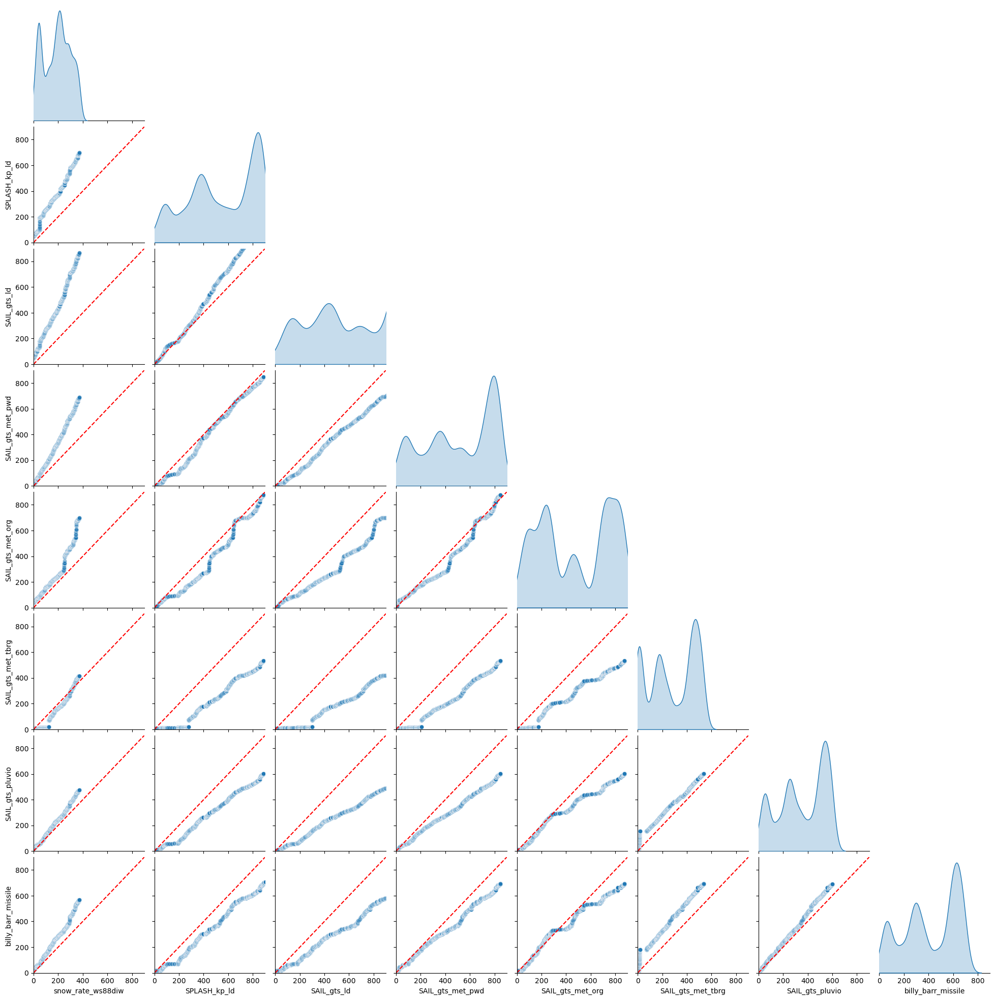

In [79]:
# get all columns with kp in them
kp_columns = [col for col in w23_all_precip_1H_df.columns if 'kp' in col] + ['billy_barr_missile']
# get all columns with gts in them
gts_columns = [col for col in w23_all_precip_1H_df.columns if 'gts' in col] + ['billy_barr_missile']
# plot all the best kp and kts sites
best_columns = ['billy_barr_missile','SPLASH_kps_sdfir','SAIL_gts_pluvio','SPLASH_kp_ld_corrected','SAIL_gts_ld_corrected','SOS_kp_SWE_p1']

cols = [col for col in w23_all_precip_1H_df.columns[::-1] if 'corrected' not in col]
# plot each column against the other in w23_all_precip_1H_df
g=sns.pairplot(data=w23_all_precip_1H_df[cols], diag_kind='kde', plot_kws={'alpha':0.5},corner=True)
# set the x and y axis limits to 0 to 900
g.set(xlim=(0,900), ylim=(0,900))
# Function to add 1:1 line
def add_1to1_line(*args, **kwargs):
    plt.plot([0, 1], [0, 1], transform=plt.gca().transAxes, ls='--', c='red')

# Map the function to the lower and upper triangles
g.map_lower(add_1to1_line)
g.map_upper(add_1to1_line)
# only show the lower triangle
g.map_upper(plt.scatter, alpha=0)

# # plot each column against the other in w23_all_precip_1H_df
# g=sns.pairplot(data=w23_all_precip_1H_df[gts_columns], diag_kind='kde', plot_kws={'alpha':0.5},corner=True)
# # set the x and y axis limits to 0 to 900
# g.set(xlim=(0,900), ylim=(0,900))
# # Function to add 1:1 line
# def add_1to1_line(*args, **kwargs):
#     plt.plot([0, 1], [0, 1], transform=plt.gca().transAxes, ls='--', c='red')

# # Map the function to the lower and upper triangles
# g.map_lower(add_1to1_line)
# g.map_upper(add_1to1_line)
# # only show the lower triangle
# g.map_upper(plt.scatter, alpha=0)

# # plot each column against the other in w23_all_precip_1H_df
# g=sns.pairplot(data=w23_all_precip_1H_df[best_columns], diag_kind='kde', plot_kws={'alpha':0.5},corner=True)
# # set the x and y axis limits to 0 to 900
# g.set(xlim=(0,900), ylim=(0,900))
# # Function to add 1:1 line
# def add_1to1_line(*args, **kwargs):
#     plt.plot([0, 1], [0, 1], transform=plt.gca().transAxes, ls='--', c='red')

# # Map the function to the lower and upper triangles
# g.map_lower(add_1to1_line)
# g.map_upper(add_1to1_line)
# # only show the lower triangle
# g.map_upper(plt.scatter, alpha=0)

<Axes: >

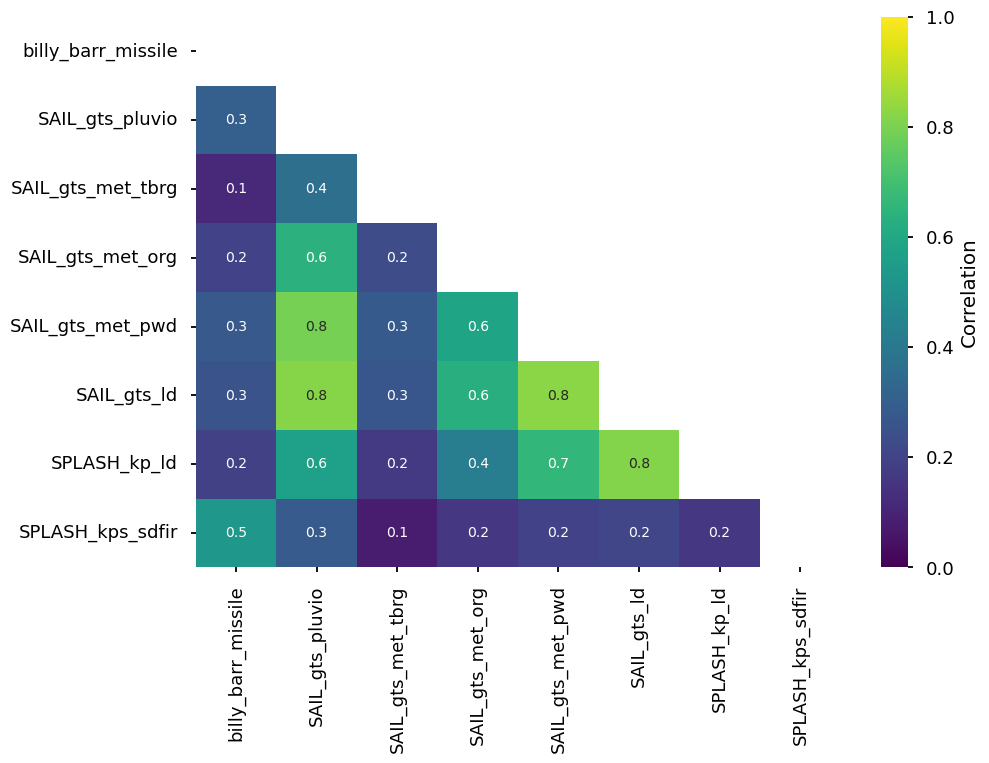

In [64]:
# Resample each dataset to hourly resolution and compute cumulative sum
resampled_datasets = [data.resample('1H').sum() for data in datasets]
corrected_cols = [col for col in w23_all_precip_1H_df.columns if 'corrected' in col]
w23_all_precip_1H_df_corr = pd.concat(resampled_datasets, axis=1).drop(columns=['range']+corrected_cols)
# describe rmse between each column
w23_all_precip_1H_df_corr = w23_all_precip_1H_df_corr.rename(columns={'Precipitation':'billy_barr_missile','Precip_mm':'SPLASH_kps_sdfir'})
mask = np.triu(np.ones_like(w23_all_precip_1H_df_corr.corr(), dtype=bool))
import seaborn as sns
sns.heatmap(w23_all_precip_1H_df_corr.corr(), cmap='viridis', annot=True, fmt=".1f", mask=mask, vmin=0, vmax=1, cbar_kws={'label':'Correlation'})
# colorbar label

<Axes: xlabel='None-None'>

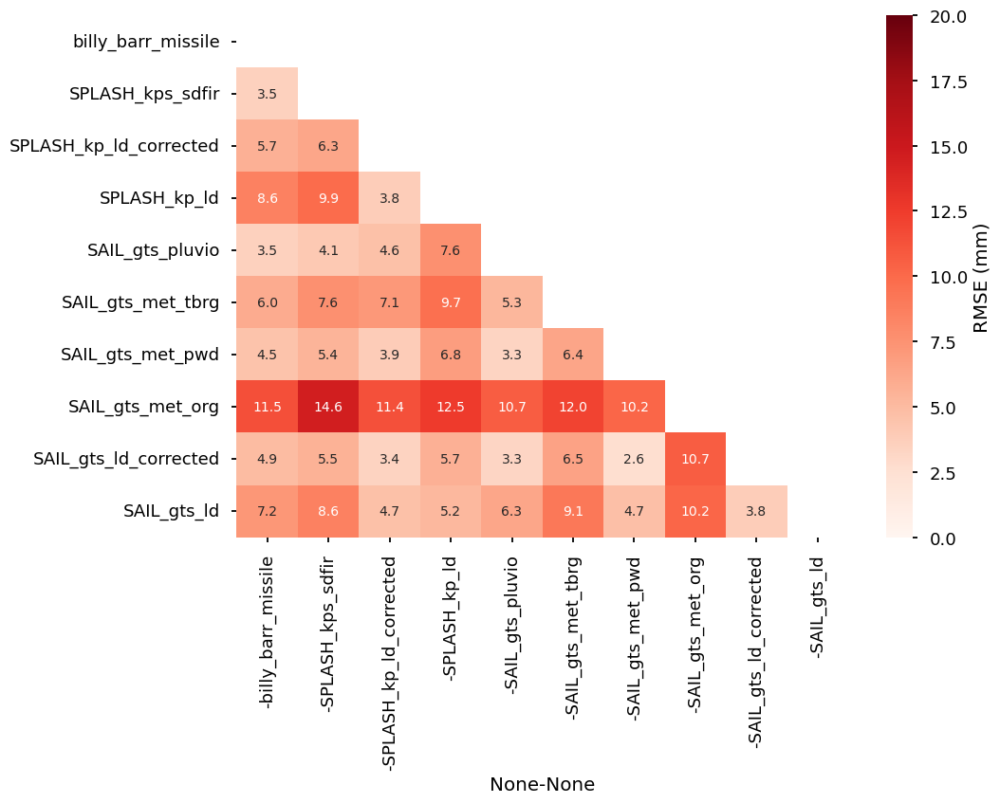

In [65]:
# Resample each dataset to hourly resolution and compute cumulative sum
plt.style.use('seaborn-v0_8-talk')
resampled_datasets = [data.resample('1D').sum() for data in datasets]
corrected_cols = [col for col in w23_all_precip_1H_df.columns if 'corrected' in col]
w23_all_precip_1H_df_rmse = pd.concat(resampled_datasets, axis=1).drop(columns=['range'])
w23_all_precip_1H_df_rmse = w23_all_precip_1H_df_rmse.rename(columns={'Precipitation':'billy_barr_missile','Precip_mm':'SPLASH_kps_sdfir'})
# describe rmse between each column
rmse = {}
def mean_squared_error(y_true, y_pred):
    return np.mean((y_true - y_pred)**2)
for col1 in w23_all_precip_1H_df_rmse.columns:
    for col2 in w23_all_precip_1H_df_rmse.columns:
        rmse[(col1,col2)] = np.sqrt(mean_squared_error(w23_all_precip_1H_df_rmse[col1],w23_all_precip_1H_df_rmse[col2]))
# make a dataframe of the rmse
rmse_df = pd.DataFrame(rmse.values(), index=pd.MultiIndex.from_tuples(rmse.keys()), columns=[''])
# rmse_df = rmse_df[w23_all_precip_1H_df_corr.columns]
# make a matrix plot of the rmse_df
mask = np.triu(np.ones_like(rmse_df.unstack(), dtype=bool))
import seaborn as sns
sns.heatmap(rmse_df.unstack()[::-1][rmse_df.unstack().columns[::-1]], cmap='Reds', annot=True, fmt=".1f", mask=mask, vmin=0, vmax=20, cbar_kws={'label':'RMSE (mm)'})
# colorbar label
